<a href="https://colab.research.google.com/github/peeyushsinghal/Stable_Diffusion_Text_Inversion/blob/main/Stable_Diffusion_Text_Inversion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install torch diffusers tranformers tqdm torchvision matplotlib

ERROR: Could not find a version that satisfies the requirement tranformers (from versions: none)
ERROR: No matching distribution found for tranformers


In [1]:
import os
import torch
import PIL
from PIL import Image
from diffusers import StableDiffusionPipeline, DiffusionPipeline
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
import numpy as np
import cv2
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torchvision.transforms as T
elastic_transformer = T.ElasticTransform(alpha=550.0,sigma=5.0)
import gc
import torch.nn.functional as F

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
torch_device        = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
height, width       = 512, 512
guidance_scale      = 8
loss_scale          = 200
num_inference_steps = 50
batch_size          = 1

In [5]:
torch_device

'cuda'

In [6]:
pretrained_model_name_or_path = "CompVis/stable-diffusion-v1-4"
pipe = DiffusionPipeline.from_pretrained(
    pretrained_model_name_or_path,
    torch_dtype=torch.float16
).to(torch_device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [7]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

def image_loss(images,loss_type):

    if loss_type == 'blue':
        # blue loss
        error = torch.abs(images[:,2] - 0.9).mean() # [:,2] -> all images in batch, only the blue channel
    elif loss_type == 'elastic':
        # elastic loss
        transformed_imgs = elastic_transformer(images) # 2,3,512,512
        error = torch.abs(transformed_imgs - images).mean()
    elif loss_type == 'symmetry':
        flipped_image = torch.flip(images, [3])
        error = F.mse_loss(images, flipped_image)
    elif loss_type == 'saturation':
        # saturation loss
        transformed_imgs = T.functional.adjust_saturation(images,saturation_factor = 10)
        error = torch.abs(transformed_imgs - images).mean()
    else:
        print("error. Loss not defined")

    return error

def latents_to_pil(latents):
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = pipe.vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1) # 0 to 1
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [8]:
def generate_image(seed_no,prompts,loss_type,loss_apply=False):

    generator           = torch.manual_seed(seed_no)

    # scheduler
    scheduler    = LMSDiscreteScheduler(beta_start = 0.00085, beta_end = 0.012, beta_schedule = "scaled_linear", num_train_timesteps = 1000)
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32)

    # text embeddings of the prompt
    text_input = pipe.tokenizer(prompts, padding='max_length', max_length = pipe.tokenizer.model_max_length, truncation= True, return_tensors="pt")
    input_ids = text_input.input_ids.to(torch_device)

    with torch.no_grad():
        text_embeddings = pipe.text_encoder(text_input.input_ids.to(torch_device))[0]

    max_length = text_input.input_ids.shape[-1]
    uncond_input = pipe.tokenizer(
          [""] * batch_size, padding="max_length", max_length= max_length, return_tensors="pt"
    )

    with torch.no_grad():
        uncond_embeddings = pipe.text_encoder(uncond_input.input_ids.to(torch_device))[0]

    text_embeddings = torch.cat([uncond_embeddings,text_embeddings]) # 2,77,768

    # random latent
    latents = torch.randn(
        (batch_size, pipe.unet.config.in_channels, height// 8, width //8),
        generator = generator,
    ) .to(torch.float16)


    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    for i, t in tqdm(enumerate(scheduler.timesteps), total = len(scheduler.timesteps)):

        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(latent_model_input.to(torch.float16), t, encoder_hidden_states=text_embeddings)["sample"]
            #noise_pred = pipe.unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        if loss_apply and i%5 == 0:

            latents = latents.detach().requires_grad_()
            #latents_x0 = scheduler.step(noise_pred,t, latents).pred_original_sample # this line does not work
            latents_x0 = latents - sigma * noise_pred

            # use vae to decode the image
            denoised_images = pipe.vae.decode((1/ 0.18215) * latents_x0).sample / 2 + 0.5 # range(0,1)

            loss = image_loss(denoised_images,loss_type) * loss_scale
            print(f"loss {loss}")

            cond_grad = torch.autograd.grad(loss, latents)[0]
            latents = latents.detach() - cond_grad * sigma**2

        latents = scheduler.step(noise_pred,t, latents).prev_sample

    return latents

In [9]:
# Load SD concepts
sdconcepts = ['<meeg>', '<midjourney-style>', '<moebius>', ' <Marc_Allante>', '<wlop-style>']

pipe.load_textual_inversion("sd-concepts-library/dreams", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/midjourney-style", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/moebius", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/style-of-marc-allante", mean_resizing=False)
pipe.load_textual_inversion("sd-concepts-library/wlop-style", mean_resizing=False)

# define seeds
seed_list = [2000,2000,500,600,100]

learned_embeds.bin:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


learned_embeds.bin:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

learned_embeds.bin:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

learned_embeds.bin:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

learned_embeds.bin:   0%|          | 0.00/3.82k [00:00<?, ?B/s]

In [10]:
prompt  = """Boy with a cowboy hat in the style of"""

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

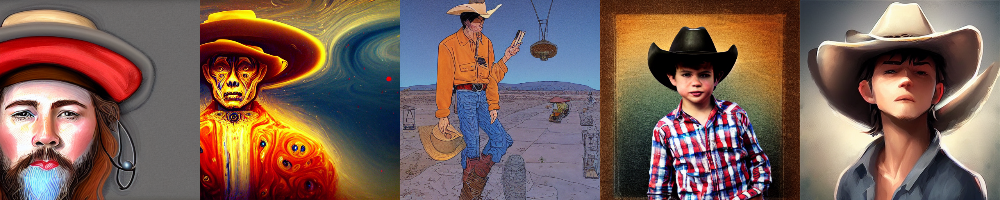

In [11]:
latents_collect = []
loss_type = 'N/A'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no, prompts,loss_type,loss_apply=False)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 7.0234375
loss 9.46875
loss 12.6484375
loss 12.3828125
loss 11.703125
loss 11.96875
loss 11.9453125
loss 12.265625
loss 12.875
loss 13.4921875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 4.984375
loss 6.7265625
loss 7.23828125
loss 8.7265625
loss 8.890625
loss 11.625
loss 12.9375
loss 11.34375
loss 11.453125
loss 11.7890625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 12.71875
loss 13.8046875
loss 29.984375
loss 32.6875
loss 39.875
loss 38.53125
loss 45.15625
loss 47.59375
loss 45.65625
loss 48.0625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 6.96875
loss 6.4140625
loss 9.390625
loss 11.78125
loss 10.1328125
loss 10.703125
loss 11.84375
loss 12.40625
loss 13.828125
loss 14.5234375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 9.7109375
loss 11.5859375
loss 14.1953125
loss 15.5546875
loss 13.8671875
loss 14.15625
loss 13.5625
loss 14.2578125
loss 14.125
loss 14.453125


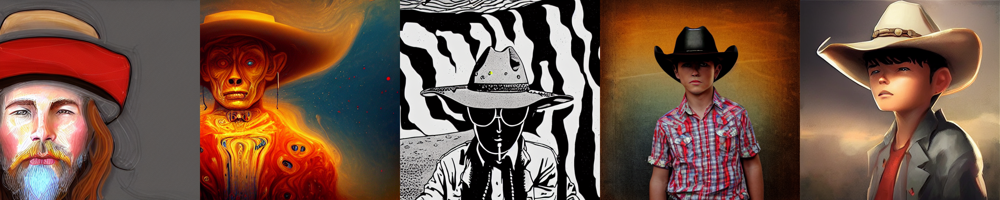

In [12]:
# after loss is applied
latents_collect = []
loss_type = 'elastic'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 20.125
loss 44.25
loss 14.953125
loss 9.9375
loss 10.7890625
loss 10.03125
loss 9.546875
loss 9.4609375
loss 9.546875
loss 9.7890625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 13.390625
loss 22.203125
loss 5.703125
loss 4.43359375
loss 6.4375
loss 4.66796875
loss 4.37890625
loss 4.0703125
loss 3.97265625
loss 3.994140625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.703125
loss 87.625
loss 63.1875
loss 76.25
loss 69.25
loss 77.375
loss 85.3125
loss 85.0
loss 84.125
loss 83.625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 2.2734375
loss 3.5546875
loss 9.984375
loss 9.5078125
loss 5.5078125
loss 5.16796875
loss 5.62890625
loss 6.31640625
loss 6.984375
loss 7.6484375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 11.796875
loss 59.28125
loss 29.609375
loss 23.75
loss 19.6875
loss 17.046875
loss 16.0
loss 15.671875
loss 15.609375
loss 15.6953125


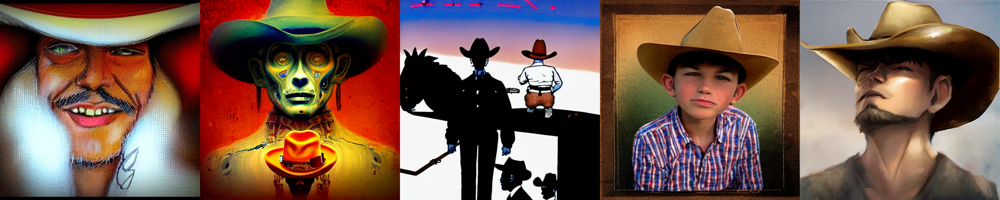

In [13]:
# after loss is applied
latents_collect = []
loss_type = 'symmetry'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 48.875
loss 33.53125
loss 23.953125
loss 21.0
loss 20.859375
loss 22.375
loss 21.03125
loss 20.09375
loss 19.578125
loss 19.203125


  0%|          | 0/50 [00:00<?, ?it/s]

loss 42.1875
loss 37.125
loss 48.09375
loss 27.265625
loss 26.484375
loss 21.5625
loss 20.640625
loss 22.515625
loss 21.46875
loss 21.34375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 57.46875
loss 26.65625
loss 24.359375
loss 22.578125
loss 20.515625
loss 19.421875
loss 18.796875
loss 18.1875
loss 17.59375
loss 17.171875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 57.8125
loss 35.25
loss 21.96875
loss 19.609375
loss 14.5625
loss 12.0
loss 10.6171875
loss 10.25
loss 10.2734375
loss 10.59375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 58.84375
loss 48.15625
loss 39.4375
loss 33.65625
loss 29.125
loss 28.15625
loss 27.375
loss 27.203125
loss 27.21875
loss 27.421875


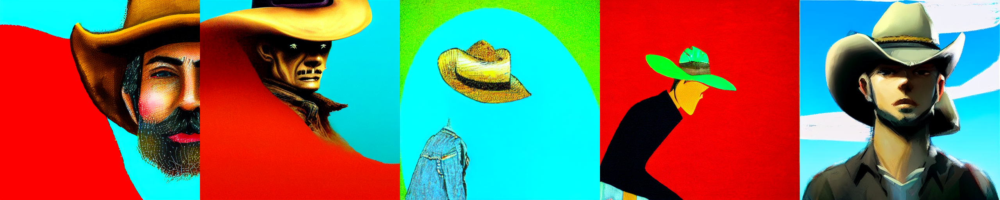

In [14]:
# after loss is applied
latents_collect = []
loss_type = 'saturation'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))

  0%|          | 0/50 [00:00<?, ?it/s]

loss 118.875
loss 42.125
loss 27.734375
loss 25.25
loss 19.5625
loss 16.140625
loss 14.109375
loss 12.875
loss 12.0546875
loss 11.4296875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 167.25
loss 53.75
loss 34.21875
loss 26.828125
loss 24.234375
loss 22.390625
loss 21.015625
loss 20.25
loss 19.75
loss 19.4375


  0%|          | 0/50 [00:00<?, ?it/s]

loss 86.375
loss 56.875
loss 47.25
loss 42.0625
loss 38.875
loss 35.875
loss 33.21875
loss 32.3125
loss 31.734375
loss 31.46875


  0%|          | 0/50 [00:00<?, ?it/s]

loss 129.5
loss 48.28125
loss 29.4375
loss 26.484375
loss 24.953125
loss 23.5625
loss 22.703125
loss 22.1875
loss 21.96875
loss 22.0625


  0%|          | 0/50 [00:00<?, ?it/s]

loss 108.875
loss 32.4375
loss 23.9375
loss 23.296875
loss 23.3125
loss 23.46875
loss 22.0625
loss 21.5
loss 20.921875
loss 20.859375


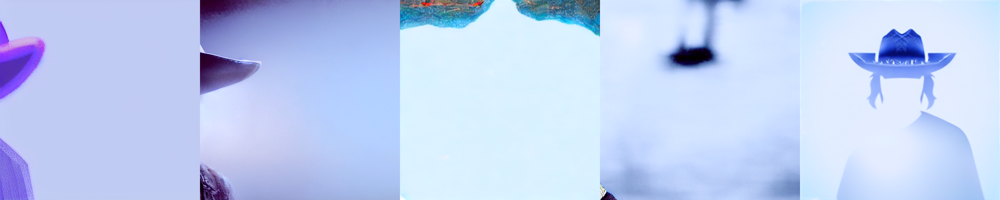

In [15]:
# after loss is applied
latents_collect = []
loss_type = 'blue'
for seed_no,sd in zip(seed_list,sdconcepts):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt} {sd}']
    latents = generate_image(seed_no,prompts,loss_type,loss_apply=True)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(latents_collect))